**Trabajo Práctico N° 9: Detección y Análisis de Contornos**

### Ejercicio 1 – Selección y Preprocesamiento de Imágenes

Se seleccionaron cuatro imágenes con características distintas (objetos definidos, superpuestos, irregulares y variados). Para cada imagen se aplicó:

- Conversión a escala de grises (`cv2.cvtColor`)
- Binarización (`cv2.threshold` o `cv2.adaptiveThreshold`)
- Operaciones morfológicas (`dilate`, `erode`, `opening`, `closing`)
- Guardado de versiones procesadas

Se observaron diferencias en el resultado de las transformaciones según el fondo, forma y claridad de los objetos.


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

In [2]:
def preprocesar_imagen(nombre_archivo, nombre_salida, umbral=127, kernel_size=(5, 5)):
    import os
    os.makedirs("salidas", exist_ok=True)

    # Cargar imagen
    imagen = cv2.imread(nombre_archivo)
    if imagen is None:
        raise ValueError(f"No se pudo cargar la imagen: {nombre_archivo}")

    # Escala de grises
    gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)

    # Umbralización adaptativa solo para la pieza
    if nombre_salida == "pieza_unica":
        binaria = cv2.adaptiveThreshold(
            gris, 255,
            cv2.ADAPTIVE_THRESH_MEAN_C,
            cv2.THRESH_BINARY_INV,
            blockSize=11,
            C=2
        )
    else:
        _, binaria = cv2.threshold(gris, umbral, 255, cv2.THRESH_BINARY)

    # Kernel morfológico
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel_size)

    # Operaciones morfológicas
    dilatada = cv2.dilate(binaria, kernel)
    erosionada = cv2.erode(binaria, kernel)
    apertura = cv2.morphologyEx(binaria, cv2.MORPH_OPEN, kernel)
    cierre = cv2.morphologyEx(binaria, cv2.MORPH_CLOSE, kernel)

    # Guardar imágenes procesadas
    cv2.imwrite(f"salidas/{nombre_salida}_gris.jpg", gris)
    cv2.imwrite(f"salidas/{nombre_salida}_binaria.jpg", binaria)
    cv2.imwrite(f"salidas/{nombre_salida}_dilatada.jpg", dilatada)
    cv2.imwrite(f"salidas/{nombre_salida}_erosionada.jpg", erosionada)
    cv2.imwrite(f"salidas/{nombre_salida}_apertura.jpg", apertura)
    cv2.imwrite(f"salidas/{nombre_salida}_cierre.jpg", cierre)

    # Mostrar resultados
    imagenes = [gris, binaria, dilatada, erosionada, apertura, cierre]
    titulos = ["Gris", "Binaria", "Dilatada", "Erosionada", "Apertura", "Cierre"]

    plt.figure(figsize=(12, 6))
    for i in range(6):
        plt.subplot(2, 3, i + 1)
        plt.imshow(imagenes[i], cmap='gray')
        plt.title(titulos[i])
        plt.axis('off')
    plt.suptitle(f"Procesamiento: {nombre_salida}", fontsize=14)
    plt.tight_layout()
    plt.show()


In [3]:
def preprocesar_imagen(nombre_archivo, nombre_salida, umbral=127, kernel_size=(5, 5)):
    import os
    os.makedirs("salidas", exist_ok=True)

    # Cargar imagen
    imagen = cv2.imread(nombre_archivo)
    if imagen is None:
        raise ValueError(f"No se pudo cargar la imagen: {nombre_archivo}")

    # Escala de grises
    gris = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)

    # CASO ESPECIAL: usar adaptiveThreshold si es "vasos" o "pieza_unica"
    if nombre_salida in ["vasos", "pieza_unica"]:
        binaria = cv2.adaptiveThreshold(
            gris, 255,
            cv2.ADAPTIVE_THRESH_MEAN_C,
            cv2.THRESH_BINARY_INV,
            blockSize=11,
            C=2
        )
    else:
        _, binaria = cv2.threshold(gris, umbral, 255, cv2.THRESH_BINARY)

    # Morfología
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel_size)
    dilatada = cv2.dilate(binaria, kernel)
    erosionada = cv2.erode(binaria, kernel)
    apertura = cv2.morphologyEx(binaria, cv2.MORPH_OPEN, kernel)
    cierre = cv2.morphologyEx(binaria, cv2.MORPH_CLOSE, kernel)

    # Guardar resultados
    cv2.imwrite(f"salidas/{nombre_salida}_gris.jpg", gris)
    cv2.imwrite(f"salidas/{nombre_salida}_binaria.jpg", binaria)
    cv2.imwrite(f"salidas/{nombre_salida}_dilatada.jpg", dilatada)
    cv2.imwrite(f"salidas/{nombre_salida}_erosionada.jpg", erosionada)
    cv2.imwrite(f"salidas/{nombre_salida}_apertura.jpg", apertura)
    cv2.imwrite(f"salidas/{nombre_salida}_cierre.jpg", cierre)

    # Visualización
    imagenes = [gris, binaria, dilatada, erosionada, apertura, cierre]
    titulos = ["Gris", "Binaria", "Dilatada", "Erosionada", "Apertura", "Cierre"]

    plt.figure(figsize=(12, 6))
    for i in range(6):
        plt.subplot(2, 3, i + 1)
        plt.imshow(imagenes[i], cmap='gray')
        plt.title(titulos[i])
        plt.axis('off')
    plt.suptitle(f"Procesamiento: {nombre_salida}", fontsize=14)
    plt.tight_layout()
    plt.show()


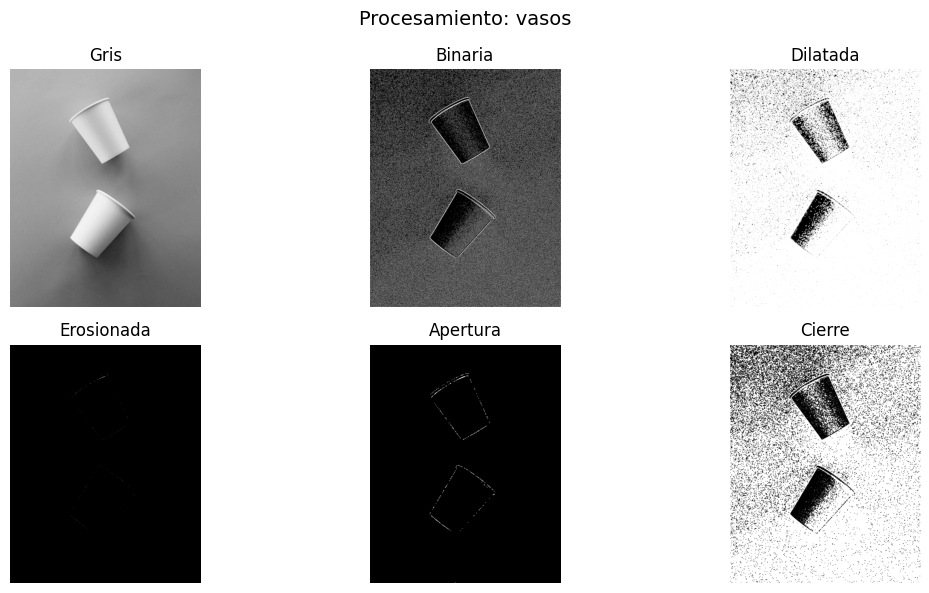

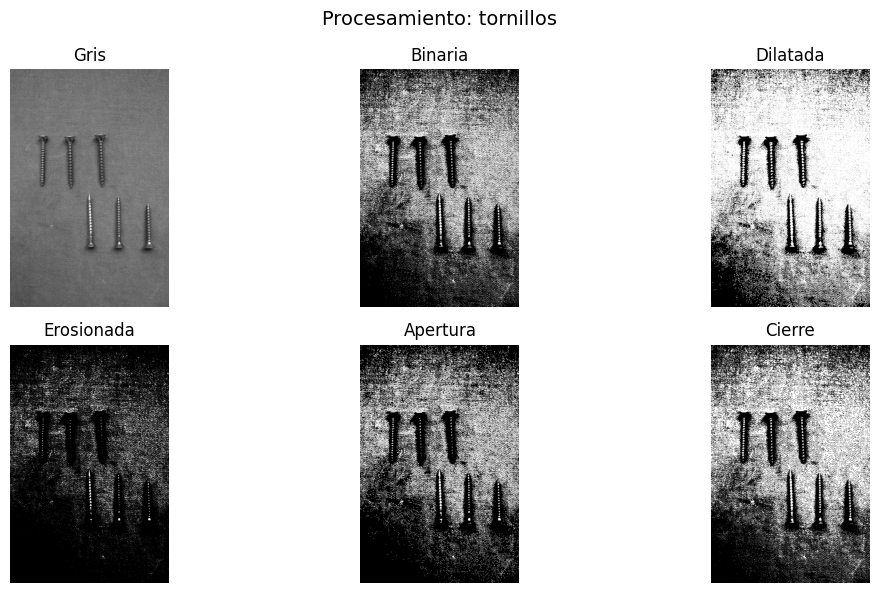

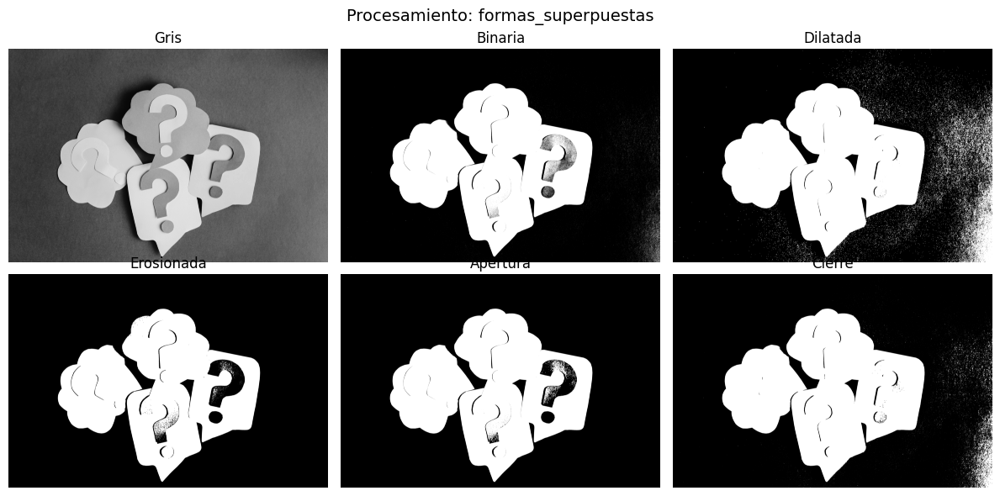

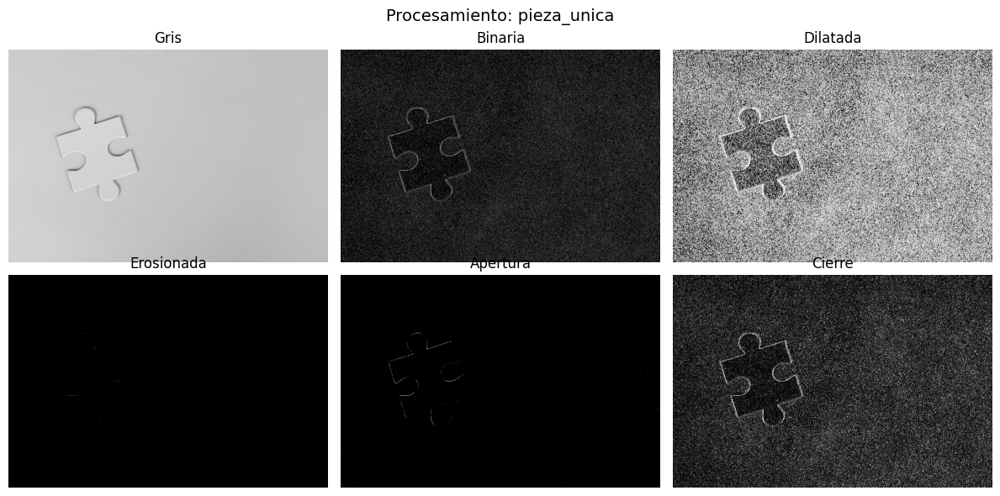

In [4]:
preprocesar_imagen("vasos.jpg", "vasos", umbral=130)
preprocesar_imagen("tornillo.jpg", "tornillos", umbral=120)
preprocesar_imagen("formas_superpuestas.jpg", "formas_superpuestas", umbral=125)
preprocesar_imagen("pieza_unica.jpg", "pieza_unica")

**Ejercicio 2 - Detección y Dibujo de Contornos**

### Ejercicio 2 – Detección y Dibujo de Contornos

Se utilizaron tres modos de detección con `cv2.findContours`:

- `RETR_EXTERNAL`: contornos externos únicamente
- `RETR_LIST`: todos los contornos sin jerarquía
- `RETR_TREE`: todos los contornos con jerarquía completa

Además, se dibujaron los contornos con `cv2.drawContours` y se filtraron por área mínima para evitar ruido.  
Los contornos válidos se dibujaron con colores diferentes según su índice y se contabilizaron los objetos externos detectados.

El análisis permitió comparar cómo varía la cantidad y estructura de contornos según el modo de jerarquía elegido.

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def detectar_y_dibujar_contornos(nombre_archivo_binario, nombre_salida, modo_retr, area_min=100):
    os.makedirs("salidas", exist_ok=True)

    # Cargar la imagen binaria
    binaria = cv2.imread(nombre_archivo_binario, cv2.IMREAD_GRAYSCALE)
    original_color = cv2.cvtColor(binaria, cv2.COLOR_GRAY2BGR)

    # Detección de contornos
    contornos, jerarquia = cv2.findContours(binaria, mode=modo_retr, method=cv2.CHAIN_APPROX_SIMPLE)

    # Preparar imagen para dibujar
    imagen_contornos = original_color.copy()
    colores = [(255, 0, 0), (0, 255, 0), (0, 0, 255),
               (255, 255, 0), (255, 0, 255), (0, 255, 255)]

    contador_validos = 0
    for i, cnt in enumerate(contornos):
        area = cv2.contourArea(cnt)
        if area >= area_min:
            color = colores[i % len(colores)]
            cv2.drawContours(imagen_contornos, contornos, i, color, 2)
            contador_validos += 1

    # Agregar contador solo si es RETR_EXTERNAL
    if modo_retr == cv2.RETR_EXTERNAL:
        texto = f"Objetos detectados: {contador_validos}"
        cv2.putText(imagen_contornos, texto, (10, 25),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 0), 2)

    # Guardar imagen
    nombre_salida_archivo = f"salidas/{nombre_salida}_contornos_{modo_retr}.jpg"
    cv2.imwrite(nombre_salida_archivo, imagen_contornos)

    # Mostrar imagen
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(imagen_contornos, cv2.COLOR_BGR2RGB))
    titulo = {
        cv2.RETR_EXTERNAL: "Contornos EXTERNOS",
        cv2.RETR_LIST: "Contornos LIST (sin jerarquía)",
        cv2.RETR_TREE: "Contornos TREE (con jerarquía)"
    }
    plt.title(f"{titulo[modo_retr]} - {nombre_salida}")
    plt.axis('off')
    plt.show()


In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def detectar_y_dibujar_contornos(nombre_archivo_binario, nombre_salida, modo_retr, area_min=800):
    os.makedirs("salidas", exist_ok=True)

    # Cargar y redimensionar imagen binaria (a 800x600 para evitar demora)
    binaria_original = cv2.imread(nombre_archivo_binario, cv2.IMREAD_GRAYSCALE)
    binaria = cv2.resize(binaria_original, (800, 600))

    # Convertir a color para dibujar contornos
    original_color = cv2.cvtColor(binaria, cv2.COLOR_GRAY2BGR)

    # Detectar contornos
    contornos, jerarquia = cv2.findContours(binaria, mode=modo_retr, method=cv2.CHAIN_APPROX_SIMPLE)

    # Dibujar contornos válidos (mayores a area_min)
    imagen_contornos = original_color.copy()
    colores = [(255, 0, 0), (0, 255, 0), (0, 0, 255),
               (255, 255, 0), (255, 0, 255), (0, 255, 255)]

    contador_validos = 0
    for i, cnt in enumerate(contornos):
        area = cv2.contourArea(cnt)
        if area >= area_min:
            color = colores[i % len(colores)]
            cv2.drawContours(imagen_contornos, contornos, i, color, 2)
            contador_validos += 1

    # Mostrar texto solo si es RETR_EXTERNAL
    if modo_retr == cv2.RETR_EXTERNAL:
        texto = f"Objetos detectados: {contador_validos}"
        cv2.putText(imagen_contornos, texto, (10, 25),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 0), 2)

    # Guardar imagen procesada
    nombre_salida_archivo = f"salidas/{nombre_salida}_contornos_{modo_retr}.jpg"
    cv2.imwrite(nombre_salida_archivo, imagen_contornos)

    # Mostrar imagen
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(imagen_contornos, cv2.COLOR_BGR2RGB))
    titulo = {
        cv2.RETR_EXTERNAL: "Contornos EXTERNOS",
        cv2.RETR_LIST: "Contornos LIST (sin jerarquía)",
        cv2.RETR_TREE: "Contornos TREE (con jerarquía)"
    }
    plt.title(f"{titulo[modo_retr]} - {nombre_salida}")
    plt.axis('off')
    plt.show()


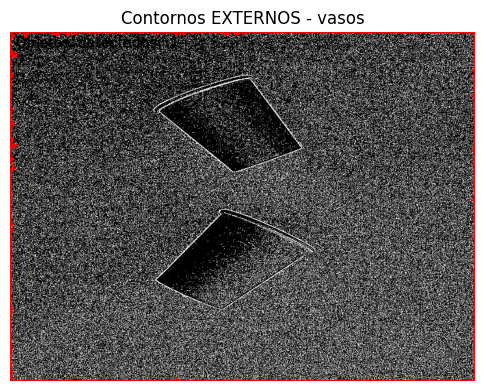

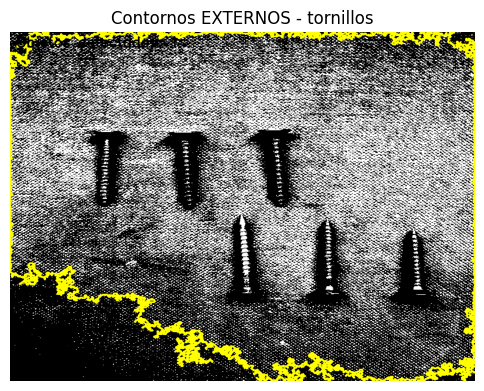

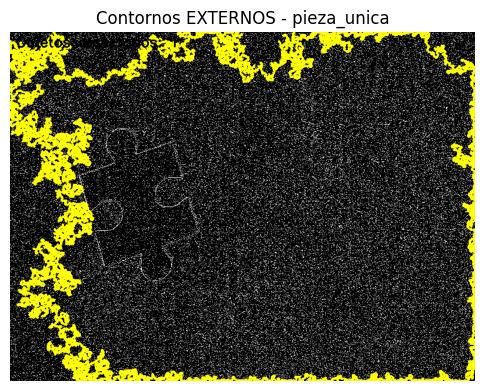

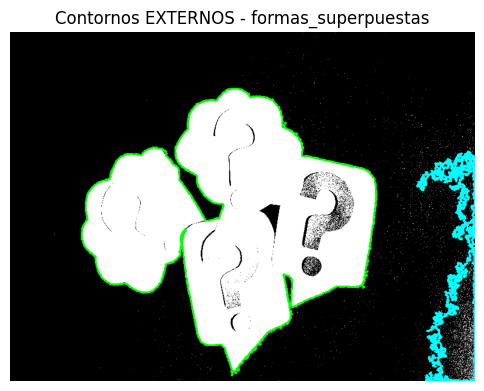

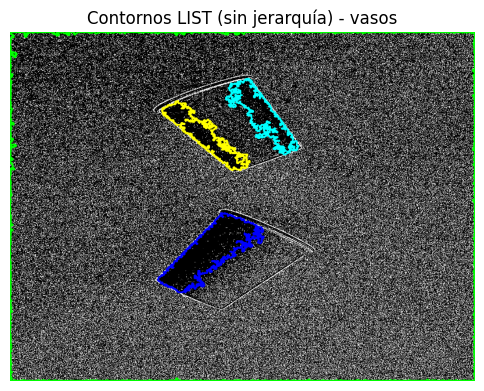

...

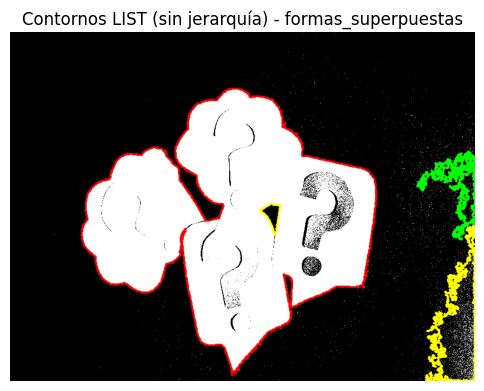

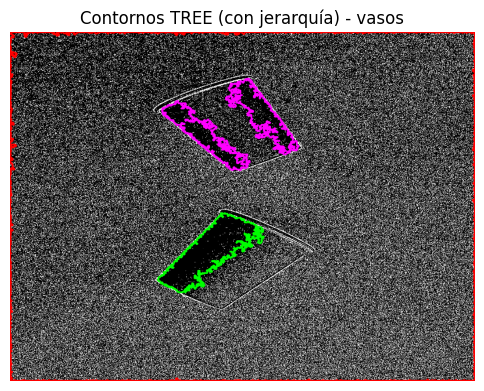

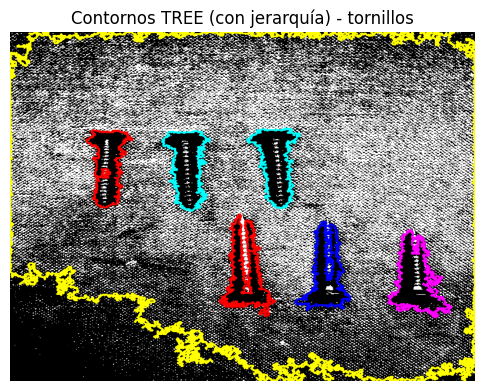

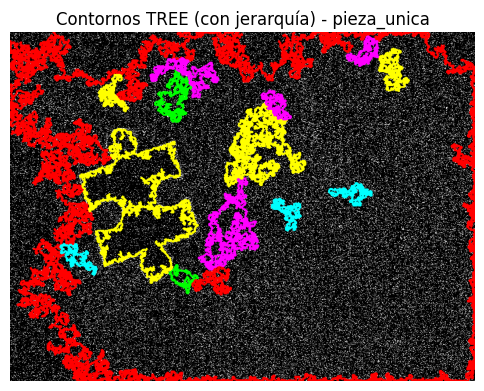

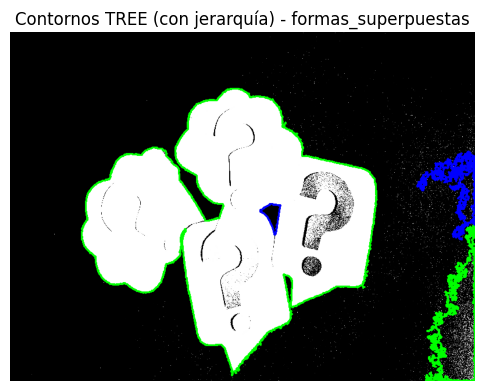

In [7]:
modos = [cv2.RETR_EXTERNAL, cv2.RETR_LIST, cv2.RETR_TREE]

for modo in modos:
    detectar_y_dibujar_contornos("salidas/vasos_binaria.jpg", "vasos", modo)
    detectar_y_dibujar_contornos("salidas/tornillos_binaria.jpg", "tornillos", modo)
    detectar_y_dibujar_contornos("salidas/pieza_unica_binaria.jpg", "pieza_unica", modo)
    detectar_y_dibujar_contornos("salidas/formas_superpuestas_binaria.jpg", "formas_superpuestas", modo)


**Ejercicio 3 - Métodos de Aproximación de Contornos**

Se compararon dos métodos de aproximación:

- `cv2.CHAIN_APPROX_NONE`: conserva todos los puntos del contorno
- `cv2.CHAIN_APPROX_SIMPLE`: simplifica los contornos en puntos clave

Se visualizó la diferencia en la cantidad de puntos utilizados.  
Luego se aplicó `cv2.approxPolyDP` para aproximar los contornos a polígonos con distintos valores de `epsilon`.  
Según la cantidad de vértices se identificaron formas geométricas aproximadas (triángulos, rectángulos, círculos).

Esto permitió observar cómo cambia la representación de un contorno según el nivel de simplificación aplicado.

In [8]:
def comparar_aproximaciones(nombre_archivo_binario, nombre_salida):
    # Cargar imagen y convertir a color
    binaria = cv2.imread(nombre_archivo_binario, cv2.IMREAD_GRAYSCALE)
    binaria = cv2.resize(binaria, (800, 600))
    color = cv2.cvtColor(binaria, cv2.COLOR_GRAY2BGR)

    # Detectar contornos con CHAIN_APPROX_NONE
    contornos_none, _ = cv2.findContours(binaria, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    # Detectar contornos con CHAIN_APPROX_SIMPLE
    contornos_simple, _ = cv2.findContours(binaria, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Dibujar ambos
    imagen_none = color.copy()
    imagen_simple = color.copy()

    cv2.drawContours(imagen_none, contornos_none, -1, (0, 255, 0), 2)
    cv2.drawContours(imagen_simple, contornos_simple, -1, (0, 0, 255), 2)

    # Mostrar cantidad de puntos del primer contorno (como ejemplo)
    if contornos_none and contornos_simple:
        print(f"{nombre_salida}:")
        print(f"CHAIN_APPROX_NONE - puntos: {len(contornos_none[0])}")
        print(f"CHAIN_APPROX_SIMPLE - puntos: {len(contornos_simple[0])}")
        print("---")

    # Mostrar resultados
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(cv2.cvtColor(imagen_none, cv2.COLOR_BGR2RGB))
    axes[0].set_title("CHAIN_APPROX_NONE")
    axes[0].axis('off')

    axes[1].imshow(cv2.cvtColor(imagen_simple, cv2.COLOR_BGR2RGB))
    axes[1].set_title("CHAIN_APPROX_SIMPLE")
    axes[1].axis('off')

    plt.suptitle(f"Aproximación de Contornos - {nombre_salida}")
    plt.show()


pieza_unica:
CHAIN_APPROX_NONE - puntos: 1
CHAIN_APPROX_SIMPLE - puntos: 1
---


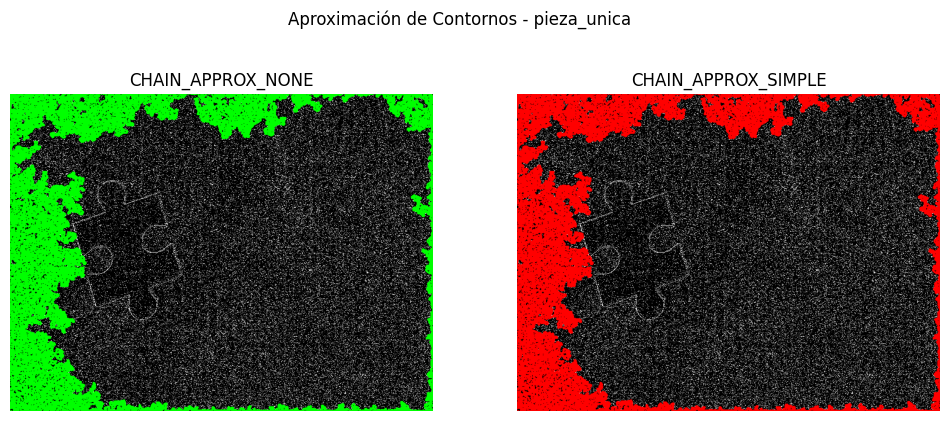

vasos:
CHAIN_APPROX_NONE - puntos: 9
CHAIN_APPROX_SIMPLE - puntos: 7
---


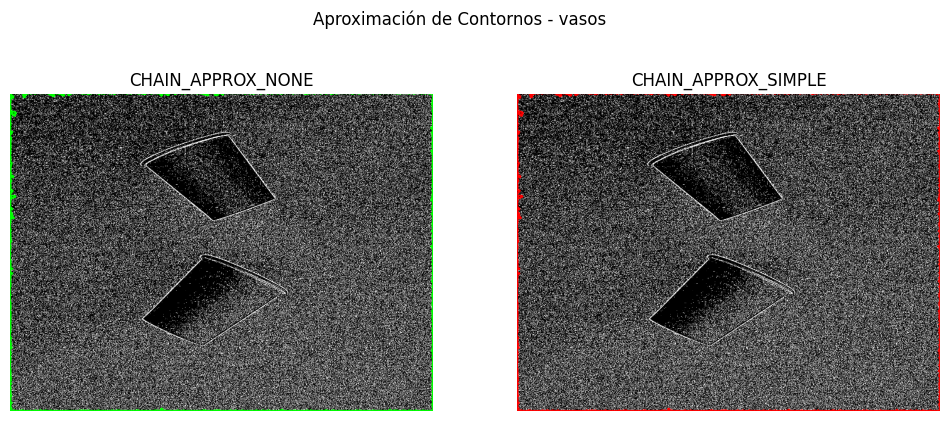

tornillos:
CHAIN_APPROX_NONE - puntos: 1
CHAIN_APPROX_SIMPLE - puntos: 1
---


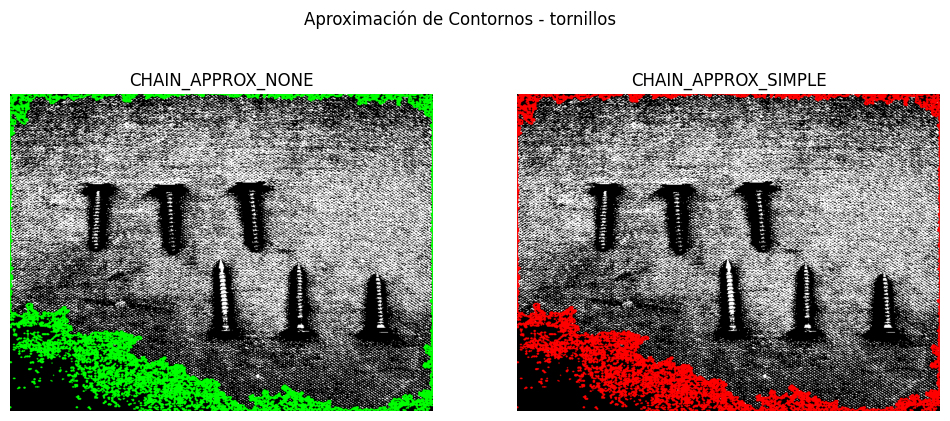

formas_superpuestas:
CHAIN_APPROX_NONE - puntos: 1
CHAIN_APPROX_SIMPLE - puntos: 1
---


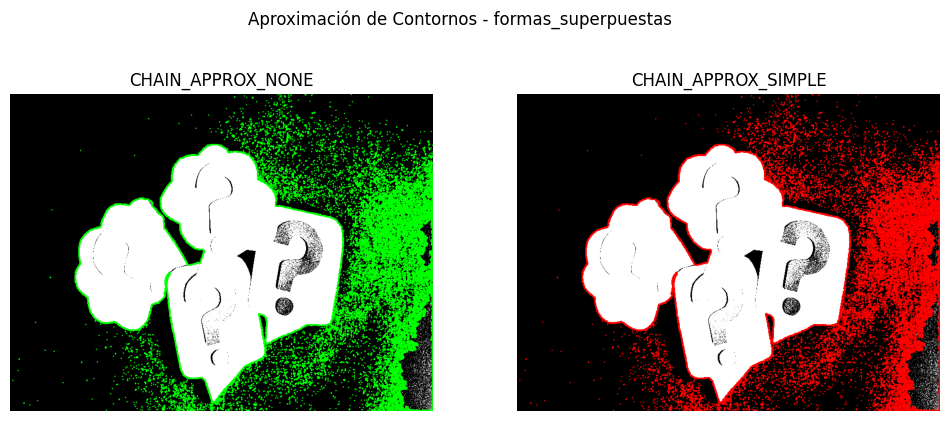

In [9]:
comparar_aproximaciones("salidas/pieza_unica_binaria.jpg", "pieza_unica")
comparar_aproximaciones("salidas/vasos_binaria.jpg", "vasos")
comparar_aproximaciones("salidas/tornillos_binaria.jpg", "tornillos")
comparar_aproximaciones("salidas/formas_superpuestas_binaria.jpg", "formas_superpuestas")

**Ejercicio 4 - Centroides y Momentos de Contornos**

### Ejercicio 4 – Centroides y Momentos de Contornos

Se calcularon los momentos de cada contorno usando `cv2.moments` y se obtuvo el centroide:  
`cx = M['m10']/M['m00']`, `cy = M['m01']/M['m00']`

Se dibujaron los centroides en las imágenes junto a un número identificador.

Además:

- Se simuló el movimiento de objetos mediante un desplazamiento artificial y se trazaron líneas entre los centroides de las imágenes para representar un sistema de seguimiento.
- Se calcularon los momentos de Hu (`cv2.HuMoments`) para determinar la similitud entre dos formas, independientemente de su rotación, escala o traslación.

Los resultados demostraron cómo los momentos permiten comparar formas y seguir objetos de forma robusta.


Cálculo de Momentos, Centroides y Etiquetado

In [10]:
def centroides_y_momentos(nombre_archivo_binario, nombre_salida, area_min=500):
    import os
    os.makedirs("salidas", exist_ok=True)

    # Cargar imagen binaria y preparar color
    binaria = cv2.imread(nombre_archivo_binario, cv2.IMREAD_GRAYSCALE)
    binaria = cv2.resize(binaria, (800, 600))
    color = cv2.cvtColor(binaria, cv2.COLOR_GRAY2BGR)

    # Encontrar contornos externos
    contornos, _ = cv2.findContours(binaria, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Dibujar y etiquetar centroides
    for i, cnt in enumerate(contornos):
        area = cv2.contourArea(cnt)
        if area >= area_min:
            M = cv2.moments(cnt)
            if M['m00'] != 0:
                cx = int(M['m10'] / M['m00'])
                cy = int(M['m01'] / M['m00'])

                # Dibujar el contorno y el centroide
                cv2.drawContours(color, [cnt], -1, (0, 255, 0), 2)
                cv2.circle(color, (cx, cy), 5, (0, 0, 255), -1)
                cv2.putText(color, f"{i+1}", (cx + 10, cy), cv2.FONT_HERSHEY_SIMPLEX,
                            0.7, (255, 0, 0), 2)

    # Guardar y mostrar imagen
    salida = f"salidas/{nombre_salida}_centroides.jpg"
    cv2.imwrite(salida, color)

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(color, cv2.COLOR_BGR2RGB))
    plt.title(f"Centroides y Momentos - {nombre_salida}")
    plt.axis('off')
    plt.show()


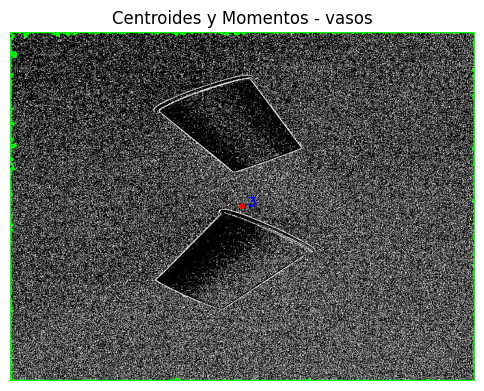

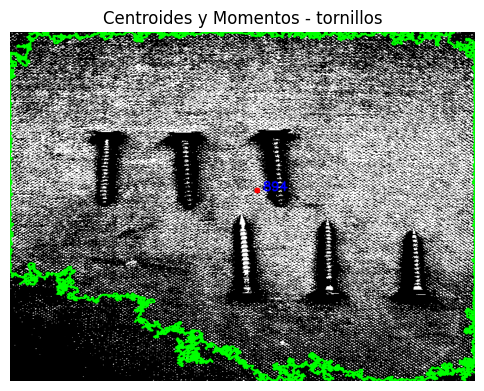

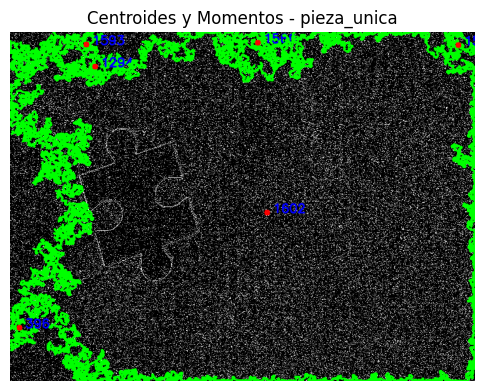

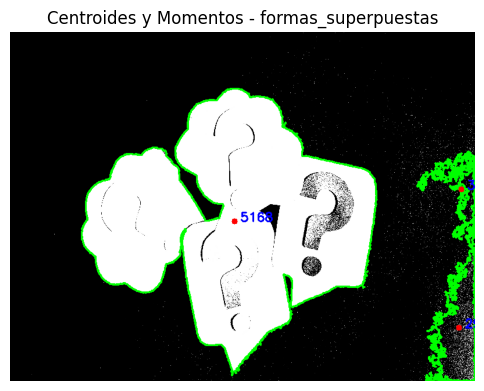

In [11]:
centroides_y_momentos("salidas/vasos_binaria.jpg", "vasos")
centroides_y_momentos("salidas/tornillos_binaria.jpg", "tornillos")
centroides_y_momentos("salidas/pieza_unica_binaria.jpg", "pieza_unica")
centroides_y_momentos("salidas/formas_superpuestas_binaria.jpg", "formas_superpuestas")


simular desplazamiento y emparejar centroides

In [12]:
def simular_y_seguir(nombre_archivo_binario):
    binaria = cv2.imread(nombre_archivo_binario, cv2.IMREAD_GRAYSCALE)
    binaria = cv2.resize(binaria, (800, 600))
    color_1 = cv2.cvtColor(binaria, cv2.COLOR_GRAY2BGR)

    # Crear versión desplazada artificialmente
    desplazamiento = 30  # pixeles
    filas, cols = binaria.shape
    M = np.float32([[1, 0, desplazamiento], [0, 1, desplazamiento]])
    binaria_2 = cv2.warpAffine(binaria, M, (cols, filas))
    color_2 = cv2.cvtColor(binaria_2, cv2.COLOR_GRAY2BGR)

    # Detectar contornos
    contornos_1, _ = cv2.findContours(binaria, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contornos_2, _ = cv2.findContours(binaria_2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Calcular centroides
    def obtener_centroides(contornos):
        centroides = []
        for cnt in contornos:
            M = cv2.moments(cnt)
            if M['m00'] != 0:
                cx = int(M['m10'] / M['m00'])
                cy = int(M['m01'] / M['m00'])
                centroides.append((cx, cy))
        return centroides

    c1 = obtener_centroides(contornos_1)
    c2 = obtener_centroides(contornos_2)

    # Dibujar seguimiento en la imagen original
    for i in range(min(len(c1), len(c2))):
        cv2.circle(color_1, c1[i], 5, (0, 255, 0), -1)
        cv2.circle(color_2, c2[i], 5, (0, 0, 255), -1)
        cv2.line(color_2, c1[i], c2[i], (255, 0, 0), 2)

    # Mostrar seguimiento
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(cv2.cvtColor(color_1, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Imagen original")
    axes[0].axis('off')

    axes[1].imshow(cv2.cvtColor(color_2, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Seguimiento simulado")
    axes[1].axis('off')

    plt.suptitle("Simulación de Seguimiento de Objetos")
    plt.show()


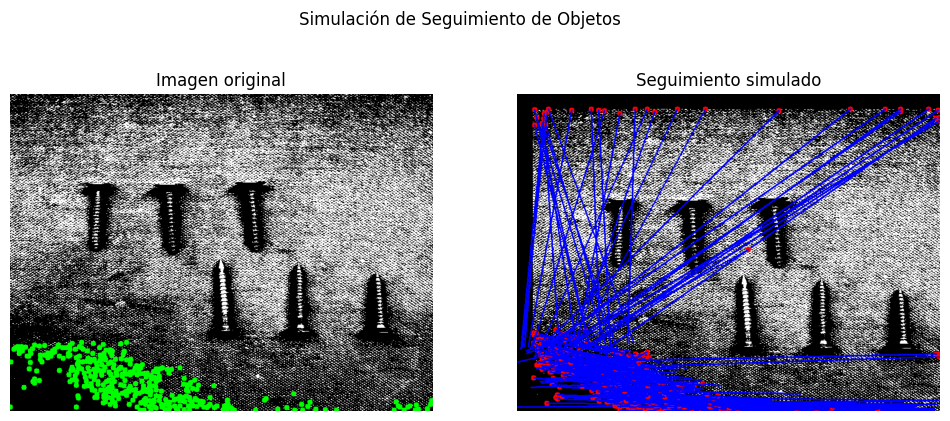

In [13]:
simular_y_seguir("salidas/tornillos_binaria.jpg")

In [14]:
def comparar_formas_por_hu(nombre_archivo_binario, area_min=500, max_comparaciones=20):
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt

    # Cargar y redimensionar imagen
    binaria = cv2.imread(nombre_archivo_binario, cv2.IMREAD_GRAYSCALE)
    binaria = cv2.resize(binaria, (800, 600))

    # Detectar contornos
    contornos, _ = cv2.findContours(binaria, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filtrar por área
    contornos = [c for c in contornos if cv2.contourArea(c) >= area_min]

    # Limitar cantidad de contornos comparados
    contornos = contornos[:max_comparaciones]

    if len(contornos) < 2:
        print("Se necesitan al menos 2 contornos válidos para comparar.")
        return

    print(f"Comparando {len(contornos)} contornos válidos (máximo {max_comparaciones}):")

    for i in range(len(contornos)):
        for j in range(i + 1, len(contornos)):
            hu1 = cv2.HuMoments(cv2.moments(contornos[i])).flatten()
            hu2 = cv2.HuMoments(cv2.moments(contornos[j])).flatten()

            diferencia = np.sum(np.abs(-np.sign(hu1) * np.log10(np.abs(hu1)) -
                                        -np.sign(hu2) * np.log10(np.abs(hu2))))
            print(f"Diferencia entre contorno {i+1} y {j+1}: {diferencia:.4f}")

    plt.close()  # Cerramos cualquier figura que pudo quedar abierta


Comparación de formas con Momentos de Hu

In [15]:
def comparar_2_formas_por_hu(nombre_archivo_binario, area_min=500):
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt

    # Cargar y redimensionar
    binaria = cv2.imread(nombre_archivo_binario, cv2.IMREAD_GRAYSCALE)
    binaria = cv2.resize(binaria, (800, 600))

    # Detectar contornos
    contornos, _ = cv2.findContours(binaria, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filtrar y tomar solo los dos más grandes
    contornos_filtrados = sorted(
        [c for c in contornos if cv2.contourArea(c) >= area_min],
        key=cv2.contourArea,
        reverse=True
    )[:2]

    if len(contornos_filtrados) < 2:
        print("No hay suficientes contornos válidos para comparar.")
        return

    # Calcular momentos de Hu
    hu1 = cv2.HuMoments(cv2.moments(contornos_filtrados[0])).flatten()
    hu2 = cv2.HuMoments(cv2.moments(contornos_filtrados[1])).flatten()

    # Calcular diferencia logarítmica
    diferencia = np.sum(np.abs(-np.sign(hu1) * np.log10(np.abs(hu1)) -
                                -np.sign(hu2) * np.log10(np.abs(hu2))))

    print(f"Diferencia entre las dos formas más grandes: {diferencia:.4f}")
    plt.close()


In [16]:
comparar_2_formas_por_hu("salidas/formas_superpuestas_binaria.jpg")

Diferencia entre las dos formas más grandes: 20.8028


### Ejercicio 5 – Discriminación de Contornos por Área y Propiedades

Se analizaron propiedades geométricas de los contornos:

- Se calculó el área (`cv2.contourArea`) y se graficó un histograma
- Se filtraron contornos según área mínima y máxima para eliminar ruido
- Se calculó el perímetro (`cv2.arcLength`) y la circularidad  
  `circularidad = (4π · área) / perímetro²`  
  según este valor, se clasificaron los objetos como **círculo**, **ovalado** o **irregular**
- Se obtuvieron rectángulos envolventes (`cv2.boundingRect`) y rotados mínimos (`cv2.minAreaRect`), comparando sus áreas
- Se analizó la jerarquía de contornos con `cv2.RETR_CCOMP` para detectar objetos que contienen agujeros internos

Este análisis permitió discriminar objetos según forma, tamaño y estructura interna.


In [17]:
def graficar_histograma_areas(nombre_archivo_binario, area_min=100):
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt

    binaria = cv2.imread(nombre_archivo_binario, cv2.IMREAD_GRAYSCALE)
    binaria = cv2.resize(binaria, (800, 600))
    contornos, _ = cv2.findContours(binaria, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Calcular áreas válidas
    areas = [cv2.contourArea(c) for c in contornos if cv2.contourArea(c) >= area_min]

    # Mostrar histograma
    plt.figure(figsize=(8, 4))
    plt.hist(areas, bins=10, color='skyblue', edgecolor='black')
    plt.title("Histograma de áreas de contornos")
    plt.xlabel("Área")
    plt.ylabel("Frecuencia")
    plt.grid(True)
    plt.show()


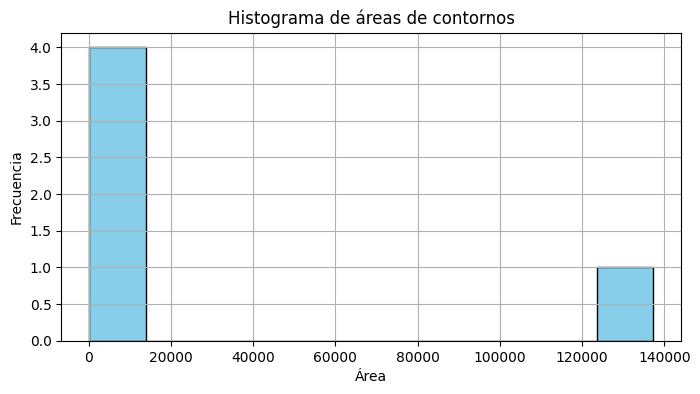

In [18]:
graficar_histograma_areas("salidas/formas_superpuestas_binaria.jpg")

In [19]:
def filtrar_contornos_por_area(nombre_archivo_binario, nombre_salida, area_min=300, area_max=10000):
    binaria = cv2.imread(nombre_archivo_binario, cv2.IMREAD_GRAYSCALE)
    binaria = cv2.resize(binaria, (800, 600))
    color = cv2.cvtColor(binaria, cv2.COLOR_GRAY2BGR)

    contornos, _ = cv2.findContours(binaria, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contornos_filtrados = [c for c in contornos if area_min <= cv2.contourArea(c) <= area_max]

    for cnt in contornos_filtrados:
        cv2.drawContours(color, [cnt], -1, (0, 255, 0), 2)

    cv2.imwrite(f"salidas/{nombre_salida}_area_filtrada.jpg", color)

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(color, cv2.COLOR_BGR2RGB))
    plt.title(f"Contornos entre área {area_min} y {area_max}")
    plt.axis('off')
    plt.show()


In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

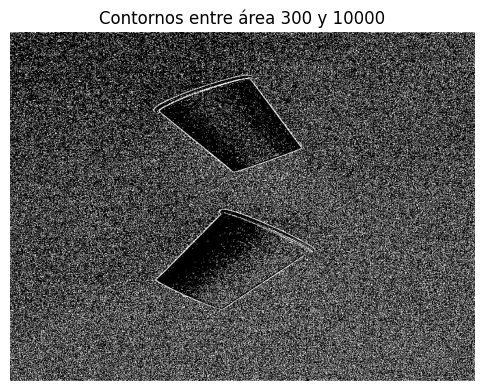

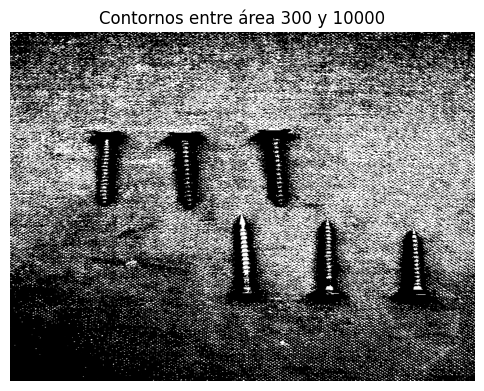

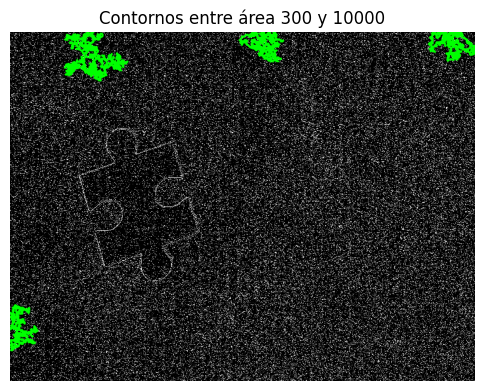

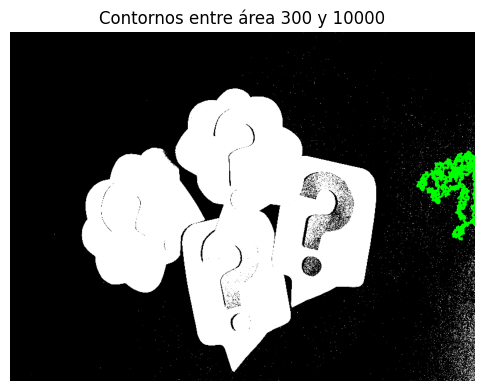

In [21]:
imagenes = [
    ("salidas/vasos_binaria.jpg", "vasos"),
    ("salidas/tornillos_binaria.jpg", "tornillos"),
    ("salidas/pieza_unica_binaria.jpg", "pieza_unica"),
    ("salidas/formas_superpuestas_binaria.jpg", "formas_superpuestas")
]

for ruta, nombre in imagenes:
    filtrar_contornos_por_area(ruta, nombre, area_min=300, area_max=10000)


**Código: área, perímetro y circularidad**

In [22]:
def analizar_perimetro_y_circularidad(nombre_archivo_binario, area_min=300):
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt

    binaria = cv2.imread(nombre_archivo_binario, cv2.IMREAD_GRAYSCALE)
    binaria = cv2.resize(binaria, (800, 600))
    contornos, _ = cv2.findContours(binaria, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    color = cv2.cvtColor(binaria, cv2.COLOR_GRAY2BGR)

    for i, cnt in enumerate(contornos):
        area = cv2.contourArea(cnt)
        if area < area_min:
            continue

        perimetro = cv2.arcLength(cnt, True)
        if perimetro == 0:
            continue  # para evitar división por cero

        circularidad = (4 * np.pi * area) / (perimetro ** 2)

        # Clasificación visual (solo a modo demostrativo)
        forma = ""
        if circularidad > 0.8:
            forma = "Círculo"
            color_contorno = (0, 255, 0)
        elif circularidad > 0.5:
            forma = "Ovalado"
            color_contorno = (0, 255, 255)
        else:
            forma = "Irregular"
            color_contorno = (255, 0, 0)

        # Dibujar contorno y texto
        cv2.drawContours(color, [cnt], -1, color_contorno, 2)
        M = cv2.moments(cnt)
        if M['m00'] != 0:
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])
            texto = f"{forma} ({circularidad:.2f})"
            cv2.putText(color, texto, (cx + 5, cy), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color_contorno, 2)

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(color, cv2.COLOR_BGR2RGB))
    plt.title("Clasificación por Circularidad")
    plt.axis('off')
    plt.show()


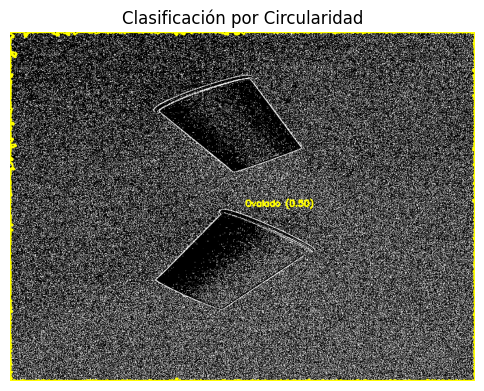

In [23]:
analizar_perimetro_y_circularidad("salidas/vasos_binaria.jpg")

**Rectángulo envolvente y mínimo rotado**

In [24]:
def rectangulos_envolventes(nombre_archivo_binario, area_min=300):
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt

    binaria = cv2.imread(nombre_archivo_binario, cv2.IMREAD_GRAYSCALE)
    binaria = cv2.resize(binaria, (800, 600))
    contornos, _ = cv2.findContours(binaria, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    color = cv2.cvtColor(binaria, cv2.COLOR_GRAY2BGR)

    for i, cnt in enumerate(contornos):
        area = cv2.contourArea(cnt)
        if area < area_min:
            continue

        # Rectángulo no rotado
        x, y, w, h = cv2.boundingRect(cnt)
        area_rect = w * h

        # Rectángulo mínimo rotado
        rot_rect = cv2.minAreaRect(cnt)
        box = cv2.boxPoints(rot_rect)
        box = np.intp(box)
        area_rotada = rot_rect[1][0] * rot_rect[1][1]

        # Dibujar ambos
        cv2.rectangle(color, (x, y), (x + w, y + h), (255, 0, 0), 2)         # azul
        cv2.drawContours(color, [box], 0, (0, 255, 255), 2)                  # amarillo

        texto = f"{i+1}"
        cx, cy = x + w // 2, y + h // 2
        cv2.putText(color, texto, (cx, cy), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 2)

        print(f"Objeto {i+1}: Área contorno={area:.2f}, Área bounding={area_rect:.2f}, Área rotada={area_rotada:.2f}")

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(color, cv2.COLOR_BGR2RGB))
    plt.title("Rectángulos Envolventes (Azul) vs Rotados (Amarillo)")
    plt.axis('off')
    plt.show()


**Detección de agujeros con jerarquía**


In [25]:
def detectar_jerarquia_agujeros(nombre_archivo_binario):
    import cv2
    import matplotlib.pyplot as plt

    binaria = cv2.imread(nombre_archivo_binario, cv2.IMREAD_GRAYSCALE)
    binaria = cv2.resize(binaria, (800, 600))
    color = cv2.cvtColor(binaria, cv2.COLOR_GRAY2BGR)

    contornos, jerarquia = cv2.findContours(binaria, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

    if jerarquia is None:
        print("No hay jerarquía disponible.")
        return

    agujeros = 0

    for i, j in enumerate(jerarquia[0]):
        parent = j[3]
        if parent != -1:  # si tiene padre, es un agujero interno
            agujeros += 1
            cv2.drawContours(color, [contornos[i]], -1, (255, 0, 255), 2)  # rosa

    print(f"Se encontraron {agujeros} contornos internos (agujeros).")

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(color, cv2.COLOR_BGR2RGB))
    plt.title("Contornos internos (agujeros) en rosa")
    plt.axis('off')
    plt.show()
